
# Introduction

This report analyzes a dataset of private messages from an online social network at UC Irvine, containing 1899 users and 59835 messages. Each message is represented as an edge (SRC, TGT, UNIXTS), where SRC is the sender (source), TGT is the recipient (target), and UNIXTS is the Unix timestamp. Our goals are to:

- Explore and describe the dataset.
- Define and answer research questions about user activity and connectivity.
- Visualize the network, emphasizing users with high centrality.

We use Python with `pandas` for data handling, `networkx` for network analysis, and `plotly` for visualization.

# 1. Setup and Data Loading

First, make sure to correctly import all the following libraries or install them if missing. Check the README.md file for the installation guide!

In [23]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import plotly.express as px
import nbformat
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import math
from collections import defaultdict
import seaborn as sns
from networkx.algorithms import community
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable


Once the above cell run correctly we can procceed by loading the dataset in `pandas` dataframe

In [24]:
# Load the dataset with columns: SRC, TGT, UNIXTS)
df = pd.read_csv('13_collegemsg_network/CollegeMsg.txt', sep=' ', header=None, names=['SRC', 'TGT', 'UNIXTS'])

# Convert UNIX timestamp to datetime
df['datetime'] = pd.to_datetime(df['UNIXTS'], unit='s', utc=True)
# Convert to local timezone Irvine (GMT-7)
# df['datetime'] = df['datetime'].dt.tz_convert('America/Los_Angeles') # questo considera anche il cambio di ora legale

print(df.head()) # example of unixts vs datetime

   SRC  TGT      UNIXTS                  datetime
0    1    2  1082040961 2004-04-15 14:56:01+00:00
1    3    4  1082155839 2004-04-16 22:50:39+00:00
2    5    2  1082414391 2004-04-19 22:39:51+00:00
3    6    7  1082439619 2004-04-20 05:40:19+00:00
4    8    7  1082439756 2004-04-20 05:42:36+00:00


Unix timestamp is the number of **seconds** since 1st January 1970 and its not very readable, so we convert it to a human readable format

---

# 2. Data Exploration

Let’s explore the dataset to understand its structure and properties.

In [25]:
# Basic statistics
print("Number of messages:", len(df))
print("Time range:", df['datetime'].min(), "to", df['datetime'].max())

# Unique users
all_users = set(df['SRC']).union(set(df['TGT']))
print("Number of unique users:", len(all_users))

Number of messages: 59835
Time range: 2004-04-15 14:56:01+00:00 to 2004-10-26 07:52:22+00:00
Number of unique users: 1899


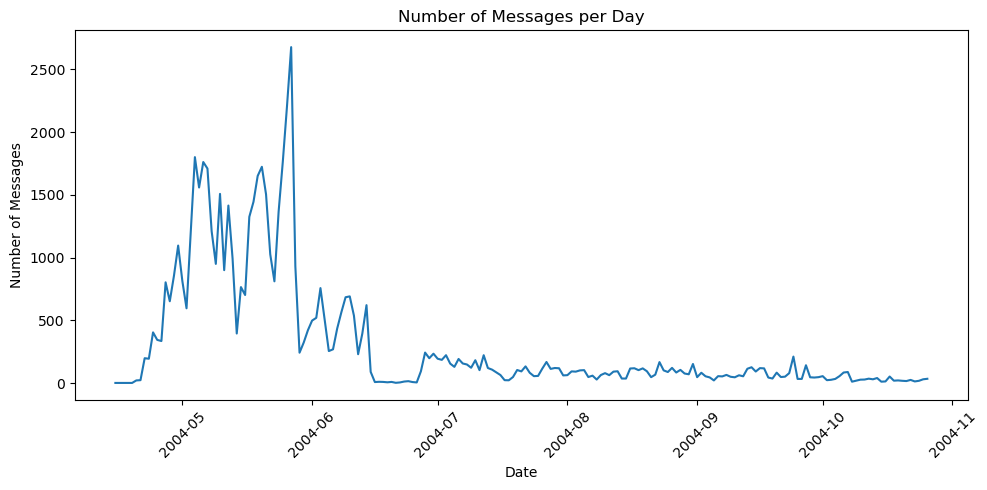

In [26]:
# Aggregate messages by date
df['date'] = df['datetime'].dt.date
messages_per_day = df.groupby('date').size().reset_index(name='count')


# print with matplotlib
plt.figure(figsize=(10, 5))
plt.plot(messages_per_day['date'], messages_per_day['count'])
plt.title('Number of Messages per Day')
plt.xlabel('Date')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




**Output Interpretation:**
- **Number of messages:** 59835 (matches the assignment description).
- **Unique users:** 1899 (confirms the number of nodes).
- **Time range:** From the earliest timestamp (Apr 15, 2004) to the latest(Oct 26, 2004), spanning several months.
- **Messages over time:** The plot shows temporal patterns, with potential peaks indicating bursts of activity (e.g., start of semesters or events).
---

# 3. Network Construction

Build a directed graph using NetworkX, which remains unchanged since it’s independent of the plotting library.

In [27]:
# Aggregate messages by source (SRC) and target (TGT)
df_grouped = df.groupby(['SRC', 'TGT']).size().reset_index(name='count')

# Create a directed graph
G = nx.from_pandas_edgelist(df_grouped, 'SRC', 'TGT', edge_attr='count', create_using=nx.DiGraph())

# Add all users as nodes (including isolated ones)
all_users = set(df['SRC']).union(set(df['TGT']))
G.add_nodes_from(all_users)

# Basic graph statistics
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Density:", nx.density(G))

Number of nodes: 1899
Number of edges: 20296
Density: 0.005631048674611617


# UTC time conversion



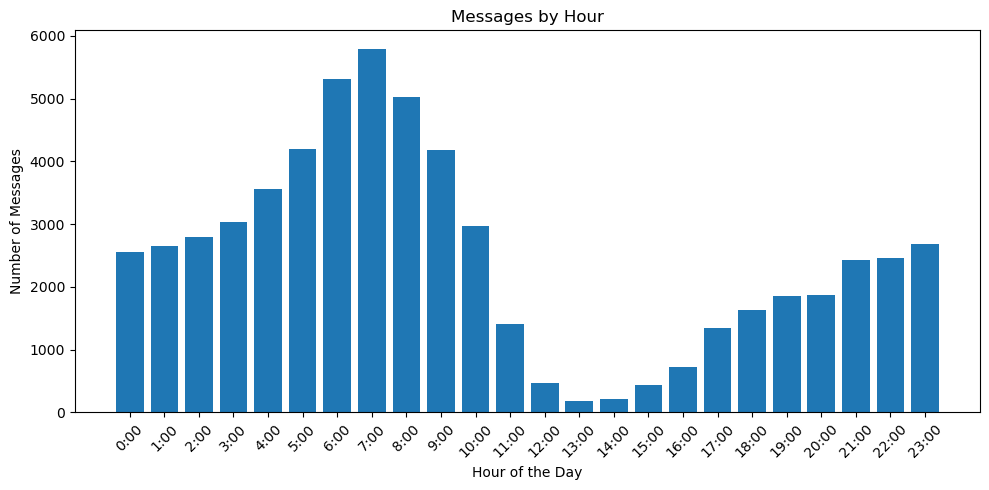

In [28]:

# Add a new column with the weekday
df['weekday'] = df['datetime'].dt.weekday
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df['weekday'].value_counts().reindex(range(7)).fillna(0)


# Add a new column with the hour
df['hour'] = df['datetime'].dt.hour
hour_counts = df['hour'].value_counts().reindex(range(24)).fillna(0)

# with matplotlib
plt.figure(figsize=(10, 5))
plt.bar(range(24), hour_counts)
plt.title('Messages by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.xticks(range(24), [f'{i}:00' for i in range(24)])
plt.tight_layout()
plt.show()




There appear to be something off with the hour of the user sending the most messages. From the grpah it seems that top user is sending messages at between 5 and 8 am UTC. This is not a common time for sending messages, so we need to check if the user is in a different timezone or if there is an error in the data.

![image](Images/UTCmap.png)

The data comes from UC Irvine, which is in the Pacific Time Zone (UTC-7). The timestamp is in UTC, so we need to convert it to Pacific Time. This means we need to subtract 7 hours from the timestamp. We can now convert the timestamp to Pacific Time and check the hour of the day for the user with the most messages.

In [29]:
df['datetime'] = df['datetime'].dt.tz_convert('America/Los_Angeles') # questo considera anche il cambio di ora legale

After the conversion, we can see that the user with the most messages is now sending messages between 10 am and 1 pm Pacific Time, which is a more common time for sending messages. This suggests that the user is indeed in the Pacific Time Zone and that there was no error in the data.

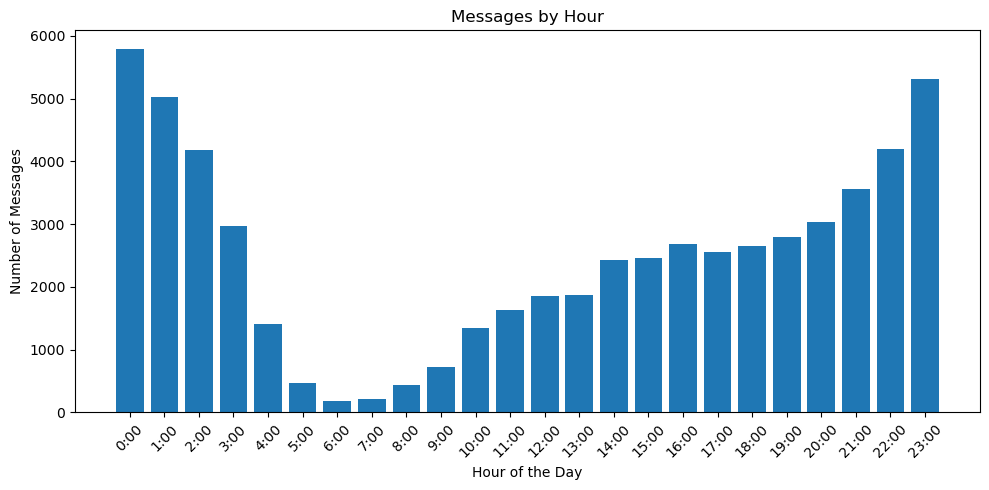

In [30]:


# Add a new column with the weekday
df['weekday'] = df['datetime'].dt.weekday
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df['weekday'].value_counts().reindex(range(7)).fillna(0)


# Add a new column with the hour
df['hour'] = df['datetime'].dt.hour
hour_counts = df['hour'].value_counts().reindex(range(24)).fillna(0)

# with matplotlib
plt.figure(figsize=(10, 5))
plt.bar(range(24), hour_counts)
plt.title('Messages by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.xticks(range(24), [f'{i}:00' for i in range(24)])
plt.tight_layout()
plt.show()


# 6. Temporal Analysis

With pandas we can take advantage of the datetime functionalities to analyze the data in a more human readable way. E.g. by weekday, month, and hour.


## Messages by different time periods

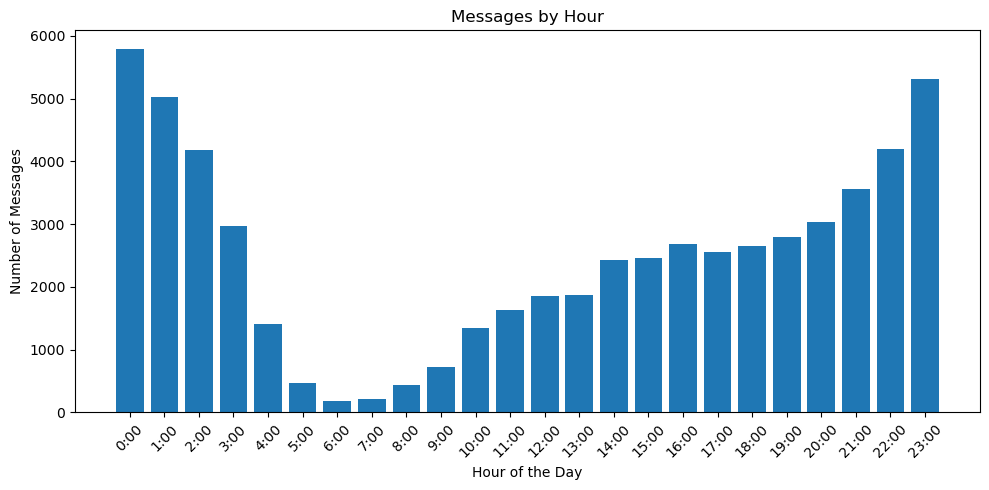

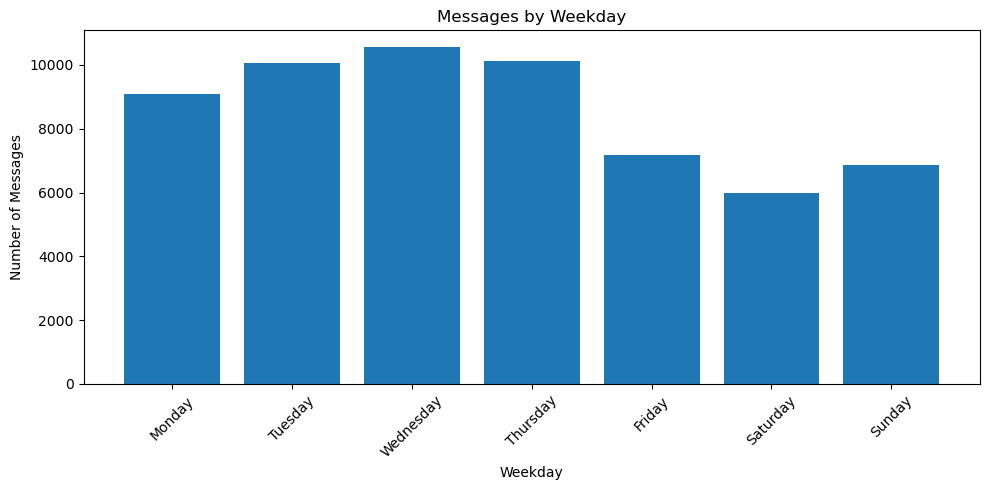

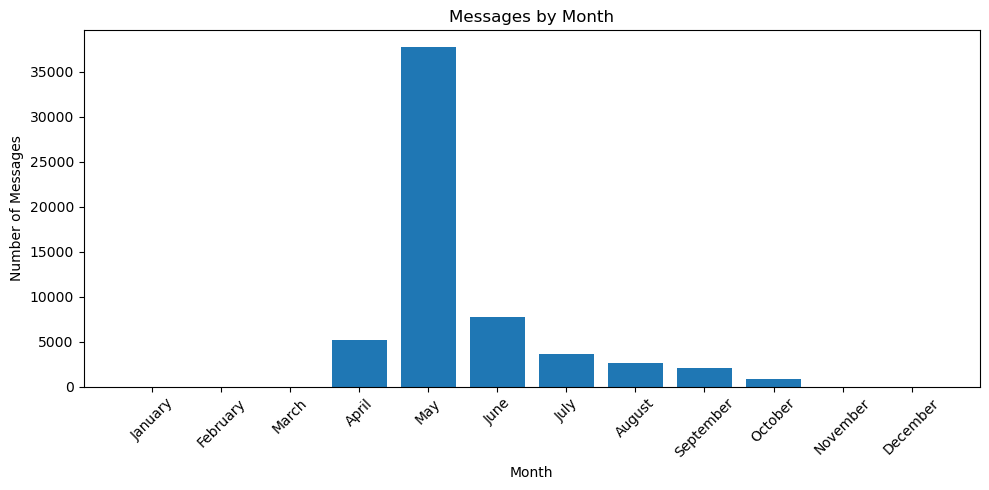

In [31]:


# Add a new column with the weekday
df['weekday'] = df['datetime'].dt.weekday
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df['weekday'].value_counts().reindex(range(7)).fillna(0)


# Add a new column with the hour
df['hour'] = df['datetime'].dt.hour
hour_counts = df['hour'].value_counts().reindex(range(24)).fillna(0)

# with matplotlib
plt.figure(figsize=(10, 5))
plt.bar(range(24), hour_counts)
plt.title('Messages by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.xticks(range(24), [f'{i}:00' for i in range(24)])
plt.tight_layout()
plt.show()


# with matplotlib
plt.figure(figsize=(10, 5))
plt.bar(weekday_names, weekday_counts)
plt.title('Messages by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



# Add a new column with the month
df['month'] = df['datetime'].dt.month
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
month_counts = df['month'].value_counts().reindex(range(1, 13)).fillna(0)

# with matplotlib
plt.figure(figsize=(10, 5))
plt.bar(month_names, month_counts)
plt.title('Messages by Month')
plt.xlabel('Month')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Top users vs Least Users analysis

        SRC   TGT      UNIXTS                  datetime        date  weekday  \
948     166   234  1082872216 2004-04-24 22:50:16-07:00  2004-04-25        5   
3267    234   166  1083222313 2004-04-29 00:05:13-07:00  2004-04-29        3   
3700    234   391  1083241257 2004-04-29 05:20:57-07:00  2004-04-29        3   
3721    297   234  1083263529 2004-04-29 11:32:09-07:00  2004-04-29        3   
3835    391   234  1083284623 2004-04-29 17:23:43-07:00  2004-04-30        3   
...     ...   ...         ...                       ...         ...      ...   
58944   234  1624  1096445591 2004-09-29 01:13:11-07:00  2004-09-29        2   
58956  1624   234  1096484960 2004-09-29 12:09:20-07:00  2004-09-29        2   
58957  1624   234  1096485028 2004-09-29 12:10:28-07:00  2004-09-29        2   
59018   234   642  1096602031 2004-09-30 20:40:31-07:00  2004-10-01        3   
59069   642   234  1096678623 2004-10-01 17:57:03-07:00  2004-10-02        4   

       hour  month  
948      22      4

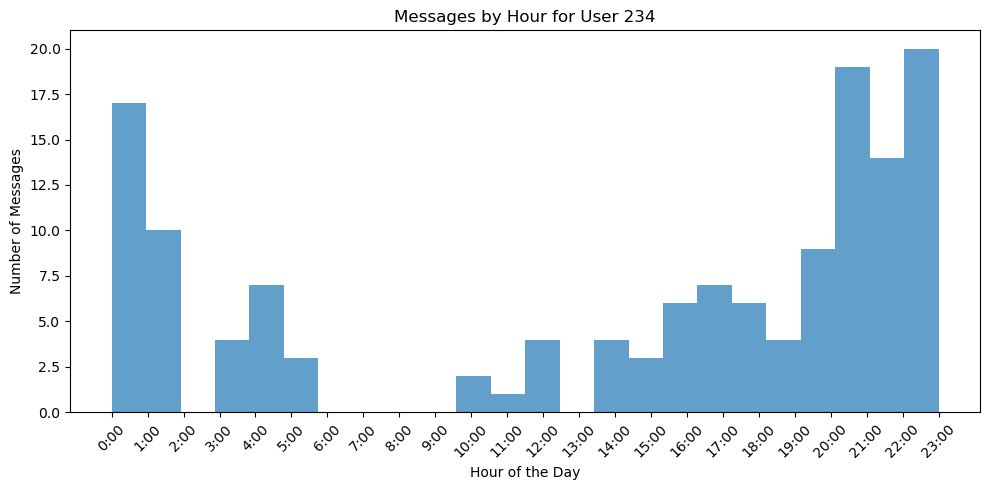

In [32]:

# select first user
user = 234
# Select messages from the user
user_messages = df[(df['SRC'] == user) | (df['TGT'] == user)]
# user_messages_by_hour = user_messages['datetime'].dt.hour
print(user_messages)

user_messages_by_hour = user_messages['datetime'].dt.hour

plt.figure(figsize=(10, 5))
plt.hist(user_messages_by_hour, bins=24, alpha=0.7)
plt.title(f'Messages by Hour for User {user}')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Messages')
plt.xticks(rotation=45)
plt.xticks(range(24), [f'{i}:00' for i in range(24)])
plt.tight_layout()
plt.show()


**Result:** Peaks in activity (e.g., mid-2004) may correlate with social events or network usage spikes.

---



Top 10 users by PageRank:
32 0.00599751428212459
42 0.005897543015508085
638 0.005389242638293345
372 0.005086009601527967
400 0.004538513498373943
103 0.004415041936696584
598 0.00438876913448408
194 0.004194510126481768
713 0.003870173119668353
249 0.003869590427168905

Less important 10 users by PageRank:


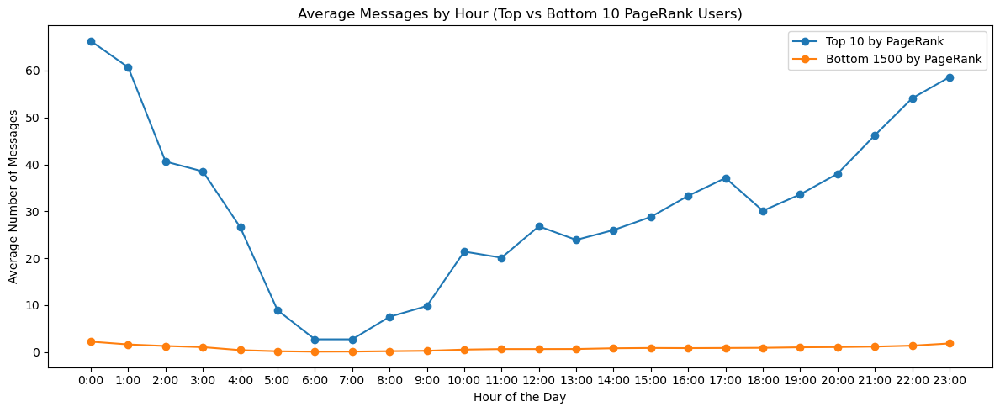

In [33]:
pagerank = nx.pagerank(G)

# Print top 10 users by PageRank
print("Top 10 users by PageRank:")
top10 = []
for user, pr in sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]:
    top10.append((user, pr))
    print(user, pr)

# Print less important 10 users by PageRank
print("\nLess important 10 users by PageRank:")
less10 = []
for user, pr in sorted(pagerank.items(), key=lambda x: x[1])[:1500]:
    less10.append((user, pr))



# Compute average messages by hour for top 10 and bottom 10 PageRank users
def average_messages_by_hour(users, df):
    user_hour_distributions = []
    for user in users:
        user_msgs = df[(df['SRC'] == user) | (df['TGT'] == user)]
        counts = user_msgs['datetime'].dt.hour.value_counts().reindex(range(24), fill_value=0)
        user_hour_distributions.append(counts.values)
    return pd.DataFrame(user_hour_distributions).mean()

avg_top10 = average_messages_by_hour([u for u, _ in top10], df)
avg_less10 = average_messages_by_hour([u for u, _ in less10], df)

# Plotting
plt.figure(figsize=(12, 5))
plt.plot(range(24), avg_top10, label='Top 10 by PageRank', marker='o')
plt.plot(range(24), avg_less10, label=f'Bottom {len(less10)} by PageRank', marker='o')
plt.title('Average Messages by Hour (Top vs Bottom 10 PageRank Users)')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Number of Messages')
plt.xticks(range(24), [f'{i}:00' for i in range(24)])
plt.legend()
plt.tight_layout()
plt.show()



### Network Structure Analysis

We examine the overall structure, including connectivity and clustering.

In [34]:

print("Checking for and adding edge weights ('weight' attribute)...")
weights_exist = any('weight' in data for u, v, data in G.edges(data=True)) if G.number_of_nodes() > 0 else False

if not weights_exist and G.number_of_nodes() > 0:
    print("Weights not found. Calculating and adding them now...")
    edge_counts = df.groupby(['SRC', 'TGT']).size().reset_index(name='weight')
    weights_dict = {(row['SRC'], row['TGT']): row['weight'] for index, row in edge_counts.iterrows()}
    filtered_weights_dict = {edge: weights_dict[edge] for edge in G.edges() if edge in weights_dict}
    nx.set_edge_attributes(G, name='weight', values=filtered_weights_dict)
    print(f"Edge weights added based on message counts.")
    weight_param = 'weight'
elif weights_exist:
    print("Edge weights ('weight' attribute) seem to already exist on the graph.")
    weight_param = 'weight'
else:
    print("Graph is empty or weights could not be added.")
    weight_param = None


if G.number_of_nodes() > 0:
    print("\nCalculating degree measures locally for this section...")
    in_degrees_unweighted = dict(G.in_degree())
    out_degrees_unweighted = dict(G.out_degree())
    if weight_param:
        in_degrees_weighted = dict(G.in_degree(weight=weight_param))
        out_degrees_weighted = dict(G.out_degree(weight=weight_param))
        print("Weighted and unweighted degrees available.")
    else:
        in_degrees_weighted, out_degrees_weighted = {}, {}
        print("Unweighted degrees available (weights unavailable).")
else:
    in_degrees_unweighted, out_degrees_unweighted = {}, {}
    in_degrees_weighted, out_degrees_weighted = {}, {}
    print("Graph empty, skipping degree calculation.")


if 'pagerank' not in locals() or not isinstance(pagerank, dict):
     print("\nWarning: 'pagerank' dictionary not found from previous cells. Correlation analysis might fail.")
     pagerank = {}

Checking for and adding edge weights ('weight' attribute)...
Weights not found. Calculating and adding them now...
Edge weights added based on message counts.

Calculating degree measures locally for this section...
Weighted and unweighted degrees available.


In [35]:
# Connected Components

num_weakly_connected = nx.number_weakly_connected_components(G)
print(f"Number of weakly connected components: {num_weakly_connected}")

num_strongly_connected = nx.number_strongly_connected_components(G)
print(f"Number of strongly connected components: {num_strongly_connected}")

# Average Clustering Coefficient

if not nx.get_edge_attributes(G, 'weight'):
    edge_counts = df.groupby(['SRC', 'TGT']).size().reset_index(name='weight')
    for index, row in edge_counts.iterrows():
         if G.has_edge(row['SRC'], row['TGT']):
              G[row['SRC']][row['TGT']]['weight'] = row['weight']

avg_clustering_unweighted = nx.average_clustering(G)
print(f"Average Clustering Coefficient (unweighted): {avg_clustering_unweighted:.6f}")


if nx.get_edge_attributes(G, 'weight'):
    avg_clustering_weighted = nx.average_clustering(G, weight='weight')
    print(f"Average Clustering Coefficient (weighted): {avg_clustering_weighted:.6f}")
else:
    print("Edge weights not found; skipping weighted clustering calculation.")

Number of weakly connected components: 4
Number of strongly connected components: 601
Average Clustering Coefficient (unweighted): 0.087239
Average Clustering Coefficient (weighted): 0.001849


In [36]:

print("Sizes of Weakly Connected Components:")
weak_component_sizes = [len(c) for c in sorted(nx.weakly_connected_components(G), key=len, reverse=True)]

if len(weak_component_sizes) > 20:
    print(f"  Largest 10: {weak_component_sizes[:10]}")
    print(f"  Smallest 10: {weak_component_sizes[-10:]}")
    print(f"  (Total: {len(weak_component_sizes)} components)")
else:
    print(f"  Sizes: {weak_component_sizes}")

print("Sizes of Strongly Connected Components:")
strong_component_sizes = [len(c) for c in sorted(nx.strongly_connected_components(G), key=len, reverse=True)]

if len(strong_component_sizes) > 20:
    print(f"  Largest 10: {strong_component_sizes[:10]}")
    print(f"  Smallest 10: {strong_component_sizes[-10:]}")
    print(f"  (Total: {len(strong_component_sizes)} components)")
else:
    print(f"  Sizes: {strong_component_sizes}")

Sizes of Weakly Connected Components:
  Sizes: [1893, 2, 2, 2]
Sizes of Strongly Connected Components:
  Largest 10: [1294, 2, 2, 2, 2, 2, 1, 1, 1, 1]
  Smallest 10: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
  (Total: 601 components)


### Betweenness Centrality Analysis

We calculate Betweenness Centrality to identify nodes acting as bridges or brokers in the network. We use inverted weights and approximation for efficiency. (PageRank assumed calculated previously; Eigenvector omitted due to calculation issues).

In [37]:
# --- Calculate Betweenness Centrality ---
print("Calculating Betweenness Centrality...")
betweenness_cen = {}
top_n = 10

if G.number_of_nodes() > 0:
    # --- Betweenness Centrality (Approximated, Weighted) ---
    print("Calculating Betweenness Centrality (approximated)...")
    k_approx = int(0.1 * G.number_of_nodes()) # Use k for approximation (10% of nodes)
    print(f"Using k={k_approx} for approximation.")
    if weight_param:
        G_inverted = G.copy() # Create a copy to add inverted weights
        for u, v, data in G.edges(data=True):
            inv_w = 1.0 / (data.get('weight', 1) + 1e-9)
            if G_inverted.has_edge(u,v):
                 G_inverted[u][v]['inv_weight'] = inv_w
        try:
             betweenness_cen = nx.betweenness_centrality(G_inverted, weight='inv_weight', normalized=True, k=k_approx)
             print("Weighted Betweenness Centrality calculated.")
             top_betweenness = sorted(betweenness_cen.items(), key=lambda item: item[1], reverse=True)[:top_n]
             print(f"\nTop {top_n} Users by Betweenness Centrality:")
             print(pd.DataFrame(top_betweenness, columns=['User ID', 'Betweenness']))
        except Exception as e:
             print(f"Error calculating weighted Betweenness Centrality: {e}")
             betweenness_cen = {}
    else: # Calculate unweighted if no weights
         try:
             betweenness_cen = nx.betweenness_centrality(G, normalized=True, k=k_approx)
             print("Unweighted Betweenness Centrality calculated.")
             top_betweenness = sorted(betweenness_cen.items(), key=lambda item: item[1], reverse=True)[:top_n]
             print(f"\nTop {top_n} Users by Betweenness Centrality:")
             print(pd.DataFrame(top_betweenness, columns=['User ID', 'Betweenness']))
         except Exception as e:
             print(f"Error calculating unweighted Betweenness Centrality: {e}")
             betweenness_cen = {}
else:
    print("Graph is empty. Skipping Betweenness Centrality calculation.")

Calculating Betweenness Centrality...
Calculating Betweenness Centrality (approximated)...
Using k=189 for approximation.
Weighted Betweenness Centrality calculated.

Top 10 Users by Betweenness Centrality:
   User ID  Betweenness
0      323     0.123326
1      105     0.086097
2     1624     0.080300
3      605     0.066972
4      679     0.062119
5      372     0.059889
6      103     0.054513
7       32     0.052985
8      398     0.046525
9      569     0.045671


### Centrality Correlation

We examine the Spearman rank correlation between the available centrality measures (Degree, assumed PageRank, and newly calculated Betweenness) to understand their relationships.


Consolidating available centrality measures...

--- Correlation Between Centrality Measures (Spearman Rank) ---
Calculating correlation for columns: ['in_degree_unw', 'out_degree_unw', 'page_rank', 'betweenness', 'in_degree_w', 'out_degree_w']
                in_degree_unw  out_degree_unw  page_rank  betweenness  \
in_degree_unw        1.000000        0.846175   0.949152     0.713516   
out_degree_unw       0.846175        1.000000   0.855375     0.756528   
page_rank            0.949152        0.855375   1.000000     0.728455   
betweenness          0.713516        0.756528   0.728455     1.000000   
in_degree_w          0.969652        0.861495   0.923763     0.740295   
out_degree_w         0.839203        0.986356   0.845147     0.770785   

                in_degree_w  out_degree_w  
in_degree_unw      0.969652      0.839203  
out_degree_unw     0.861495      0.986356  
page_rank          0.923763      0.845147  
betweenness        0.740295      0.770785  
in_degree_w        1.00

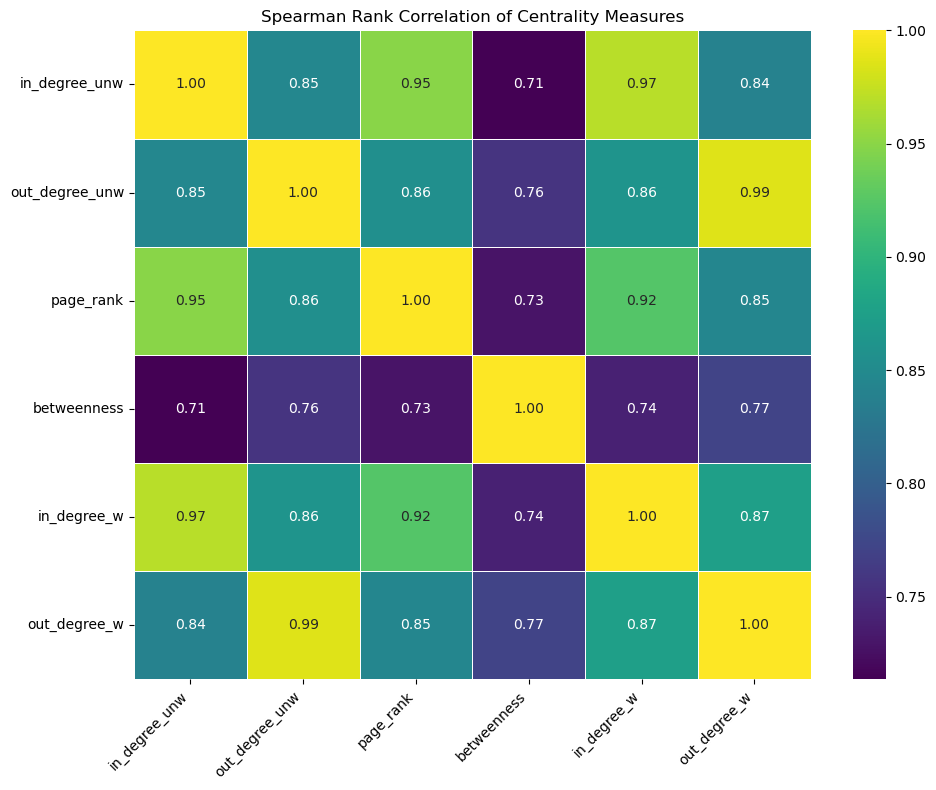

In [38]:
# --- Consolidate and Correlate Centralities ---
print("\nConsolidating available centrality measures...")

if G.number_of_nodes() > 0:
    # Create the DataFrame using assumed 'pagerank' and calculated 'betweenness_cen'
    centrality_data = {
        'in_degree_unw': pd.Series(in_degrees_unweighted),
        'out_degree_unw': pd.Series(out_degrees_unweighted),
        'page_rank': pd.Series(pagerank), # Relies on pagerank from previous cells
        'betweenness': pd.Series(betweenness_cen)
    }
    if in_degrees_weighted:
        centrality_data['in_degree_w'] = pd.Series(in_degrees_weighted)
    if out_degrees_weighted:
        centrality_data['out_degree_w'] = pd.Series(out_degrees_weighted)

    centrality_df = pd.DataFrame(centrality_data)
    centrality_df.fillna(0, inplace=True) # Fill NaNs

    print("\n--- Correlation Between Centrality Measures (Spearman Rank) ---")
    if not centrality_df.empty and centrality_df.shape[1] > 1:
        # Filter out columns with no variance (e.g., if pagerank wasn't found and is empty)
        numeric_centrality_df = centrality_df.select_dtypes(include=np.number)
        columns_to_keep = numeric_centrality_df.std() > 1e-9
        # Ensure 'page_rank' column exists after filtering before proceeding
        if 'page_rank' not in numeric_centrality_df.columns and 'page_rank' in centrality_data:
             print("Warning: PageRank column had zero variance or was missing, excluded from correlation.")

        numeric_centrality_df = numeric_centrality_df.loc[:, columns_to_keep]


        if numeric_centrality_df.shape[1] > 1:
            print(f"Calculating correlation for columns: {list(numeric_centrality_df.columns)}")
            centrality_corr = numeric_centrality_df.corr(method='spearman')
            print(centrality_corr)

            # Heatmap Visualization
            plt.figure(figsize=(10, 8))
            sns.heatmap(centrality_corr, annot=True, cmap='viridis', fmt=".2f", linewidths=.5)
            plt.title('Spearman Rank Correlation of Centrality Measures')
            plt.xticks(rotation=45, ha='right')
            plt.yticks(rotation=0)
            plt.tight_layout()
            plt.show()
        else:
             print("Insufficient columns with variance for correlation calculation.")
    else:
        print("Centrality DataFrame is empty or has too few columns.")
else:
    print("Graph is empty. Skipping centrality consolidation and correlation.")

### Network Patterns: Degree Correlation

We investigate the relationship between sending and receiving behavior by examining the correlation between node in-degrees and out-degrees.

Analyzing In-Degree vs. Out-Degree Correlation...
Using degrees from centrality_df.

Pearson Correlation between Unweighted In-Degree and Out-Degree: 0.8311


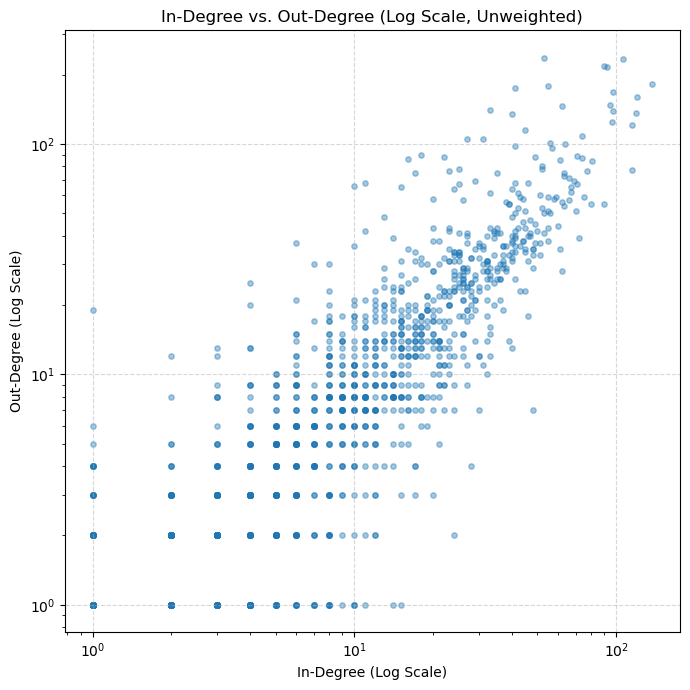

In [39]:
# --- Degree Correlation Analysis ---
print("Analyzing In-Degree vs. Out-Degree Correlation...")


if 'centrality_df' in locals() and 'in_degree_unw' in centrality_df and 'out_degree_unw' in centrality_df:
    degree_df = centrality_df[['in_degree_unw', 'out_degree_unw']]
    print("Using degrees from centrality_df.")
elif 'in_degrees_unweighted' in locals() and 'out_degrees_unweighted' in locals():
    degree_df = pd.DataFrame({
        'in_degree_unw': pd.Series(in_degrees_unweighted),
        'out_degree_unw': pd.Series(out_degrees_unweighted)
    })
    degree_df.fillna(0, inplace=True)
    print("Created DataFrame for degrees.")
else:
    degree_df = pd.DataFrame()
    print("Degree data not found. Skipping degree correlation.")

if not degree_df.empty and degree_df.shape[1] == 2:
    # Calculate Pearson correlation
    if degree_df['in_degree_unw'].var() > 1e-9 and degree_df['out_degree_unw'].var() > 1e-9:
        degree_corr = degree_df['in_degree_unw'].corr(degree_df['out_degree_unw'], method='pearson')
        print(f"\nPearson Correlation between Unweighted In-Degree and Out-Degree: {degree_corr:.4f}")

        # Scatter Plot (Log Scale)
        plt.figure(figsize=(7, 7))
        plot_df_deg = degree_df[(degree_df['in_degree_unw'] > 0) & (degree_df['out_degree_unw'] > 0)]
        if not plot_df_deg.empty:
            plt.scatter(plot_df_deg['in_degree_unw'], plot_df_deg['out_degree_unw'], alpha=0.4, s=15)
            plt.title('In-Degree vs. Out-Degree (Log Scale, Unweighted)')
            plt.xlabel('In-Degree (Log Scale)')
            plt.ylabel('Out-Degree (Log Scale)')
            plt.xscale('log')
            plt.yscale('log')
            plt.grid(True, linestyle='--', alpha=0.5)
            plt.tight_layout()
            plt.show()
        else:
            print("No nodes with both in-degree and out-degree > 0 for scatter plot.")
    else:
         print("\nSkipping degree correlation: columns have zero variance.")
else:
    print("\nSkipping degree correlation: DataFrame unsuitable.")

### Strongly Connected Components (SCC) Visualization

Strongly connected components (SCCs) represent parts of the directed network where every node can reach every other node within the component by following the directed edges. Visualizing these helps understand the core(s) and periphery of the message flow.

In [40]:
# --- Visualization of Strongly Connected Components ---
print("Starting SCC visualization generation...")


if 'G' not in locals() or not isinstance(G, nx.DiGraph) or G.number_of_nodes() == 0:
    print("Graph 'G' is not available or empty. Skipping SCC visualization.")
else:
    # --- Calculate Strongly Connected Components ---
    print("Calculating strongly connected components...")
    scc_generator = nx.strongly_connected_components(G)
    scc_list = sorted(list(scc_generator), key=len, reverse=True)
    print(f"Found {len(scc_list)} strongly connected components.")

    # --- Define node_degrees for sizing (using total unweighted degree) ---
    print("Calculating node degrees for sizing...")
    node_degrees = dict(G.degree()) # Using total degree (in+out) for visual prominence
    print("Node degrees calculated.")

    # --- Calculate or Reuse layout ---
    if 'pos' not in locals() or pos is None: # Check if pos from previous Plotly step exists
        print("Calculating spring layout (as 'pos' not found)...")
        try:
            # Adjust layout parameters if needed for better visualization
            pos = nx.spring_layout(G, seed=42, k=0.15, iterations=50)
            print("Layout calculated.")
        except Exception as e:
            print(f"Error during layout calculation: {e}. Using random layout.")
            pos = nx.random_layout(G, seed=42)
    else:
        print("Reusing existing layout 'pos'.")

    # --- Categorize nodes by SCC ---
    print("Categorizing nodes by SCC...")
    node_scc_category = {}
    largest_scc_nodes = set()
    if scc_list:
        largest_scc_nodes = scc_list[0] if len(scc_list[0]) > 1 else set() # Consider largest SCC only if size > 1
        core_label = f'Core (Largest SCC, Size {len(largest_scc_nodes)})' if largest_scc_nodes else 'No Multi-Node Core SCC'

        for component in scc_list:
            size = len(component)
            if component == largest_scc_nodes and size > 1:
                category = core_label
            elif size > 1:
                category = f'Other Multi-Node SCC (Size {size})'
            else: # size == 1
                category = 'Peripheral (Size 1)'

            for node in component:
                node_scc_category[node] = category
    else: # Should not happen if G is not empty, but handle defensively
        print("Warning: No strongly connected components found.")
        for node in G.nodes(): node_scc_category[node] = 'Undefined SCC'
    print("Node categorization complete.")

    # --- Define category colors ---
    print("Defining category colors...")
    category_colors_map = {'Undefined SCC': 'rgba(0, 0, 0, 0.5)'}
    if largest_scc_nodes:
         category_colors_map[core_label] = 'rgba(227, 26, 28, 0.9)' # Red for Core
    else: # If no multi-node core exists
         category_colors_map['No Multi-Node Core SCC'] = 'rgba(227, 26, 28, 0.9)' # Still use Red for this label

    # Handle Peripheral first to ensure it gets Grey
    if any(cat == 'Peripheral (Size 1)' for cat in node_scc_category.values()):
         category_colors_map['Peripheral (Size 1)'] = 'rgba(200, 200, 200, 0.7)' # Grey

    # Assign distinct colors to the 'Other Multi-Node SCC' categories
    other_scc_categories = sorted([cat for cat in set(node_scc_category.values()) if cat.startswith('Other')])
    palette = px.colors.qualitative.Plotly # Use a Plotly palette

    print(f"Found {len(other_scc_categories)} 'Other Multi-Node SCC' categories.")
    for i, cat in enumerate(other_scc_categories):
         category_colors_map[cat] = palette[i % len(palette)]
    print("Color mapping defined.")

    # --- Create edge trace ---
    print("Creating edge trace...")
    edge_x, edge_y = [], []
    for edge in G.edges():
        if edge[0] in pos and edge[1] in pos:
            x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None]); edge_y.extend([y0, y1, None])
    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.3, color='rgba(180, 180, 180, 0.6)'), hoverinfo='none', mode='lines')
    print("Edge trace created.")

    # --- Create node trace ---
    print("Creating node trace...")
    node_x, node_y, node_text, node_color, node_size = [], [], [], [], []
    min_size, max_size, sizing_mode = 5, 30, 'diameter'
    degrees_present = [node_degrees.get(node, 0) for node in G.nodes() if node in node_degrees and node in pos]
    min_deg, max_deg = (min(degrees_present), max(degrees_present)) if degrees_present else (0, 1)
    if max_deg == min_deg: max_deg += 1e-6 # Avoid division by zero

    for node in G.nodes():
        if node in pos:
            x, y = pos[node]
            node_x.append(x); node_y.append(y)
            degree = node_degrees.get(node, 0)
            category = node_scc_category.get(node, 'Undefined SCC')
            node_color.append(category_colors_map.get(category, 'black'))
            size = min_size + (degree - min_deg) * (max_size - min_size) / (max_deg - min_deg) if max_deg > min_deg else min_size
            node_size.append(max(min_size, size))
            node_text.append(f'User: {node}<br>Degree: {degree}<br>SCC: {category}')

    sizeref = max(node_size) / max_size if node_size and max_size > 0 and sizing_mode == 'diameter' else 1 # Adjusted sizeref calculation slightly

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text', text=node_text,
        marker=dict(showscale=False, color=node_color, size=node_size, sizemode=sizing_mode, sizeref=sizeref, sizemin=min_size,
                    line=dict(width=0.8, color='rgba(40, 40, 40, 0.8)')))
    print("Node trace created.")

    # --- Create figure ---
    print("Creating figure layout...")
    annotation_text = "Nodes colored by SCC category (Red=Core, Grey=Peripheral). Sized by total degree."
    fig_scc = go.Figure(data=[edge_trace, node_trace],
                 layout=go.Layout(
                    title=dict(text='Network Visualization by Strongly Connected Component Category', font=dict(size=18)),
                    showlegend=False, hovermode='closest', margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[ dict(text=annotation_text, showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.02, font=dict(size=10))],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), # Removed fixed range
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    plot_bgcolor='rgba(250, 250, 250, 1)')
                 )
    print("Figure created. Showing plot...")
    fig_scc.show()

Starting SCC visualization generation...
Calculating strongly connected components...
Found 601 strongly connected components.
Calculating node degrees for sizing...
Node degrees calculated.
Reusing existing layout 'pos'.
Categorizing nodes by SCC...
Node categorization complete.
Defining category colors...
Found 1 'Other Multi-Node SCC' categories.
Color mapping defined.
Creating edge trace...
Edge trace created.
Creating node trace...
Node trace created.
Creating figure layout...
Figure created. Showing plot...


### Network Patterns: Degree Assortativity

Now, let's examine the network's mixing patterns. Degree assortativity measures the tendency for nodes to connect to other nodes with similar degrees.
- Positive assortativity: High-degree nodes tend to connect to other high-degree nodes.
- Negative assortativity (disassortativity): High-degree nodes tend to connect to low-degree nodes (hub-and-spoke).
- Zero assortativity: Connections are random with respect to degree.

In [41]:
print("--- Calculating Degree Assortativity ---")
if 'G' in locals() and isinstance(G, (nx.Graph, nx.DiGraph)):
    try:
        # Calculate degree assortativity coefficient for the directed graph
        assortativity_val = nx.degree_assortativity_coefficient(G)
        print(f"Degree Assortativity Coefficient: {assortativity_val:.4f}")
        if assortativity_val > 0.1:
            print("Interpretation: The network is assortative (high-degree nodes connect to high-degree nodes).")
        elif assortativity_val < -0.1:
            print("Interpretation: The network is disassortative (high-degree nodes connect to low-degree nodes).")
        else:
            print("Interpretation: The network shows little assortativity preference (connections are somewhat random regarding degree).")
    except Exception as e:
        print(f"Could not calculate assortativity: {e}")
else:
    print("Graph object 'G' not found or is not a NetworkX graph.")

--- Calculating Degree Assortativity ---
Degree Assortativity Coefficient: -0.1375
Interpretation: The network is disassortative (high-degree nodes connect to low-degree nodes).


### Network Patterns: Graph Reciprocity

Reciprocity quantifies the tendency for links in a directed graph to be mutual. It measures the proportion of connected node pairs (A, B) where both A->B and B->A links exist. A high value indicates a strong tendency towards mutual relationships.

In [42]:
print("\n--- Calculating Graph Reciprocity ---")
if 'G' in locals() and isinstance(G, nx.DiGraph):
    try:
        # Calculate graph-level reciprocity
        reciprocity_val = nx.reciprocity(G)
        print(f"Graph Reciprocity: {reciprocity_val:.4f}")
        if reciprocity_val > 0.5:
            print("Interpretation: There is a strong tendency for mutual connections in the network.")
        elif reciprocity_val > 0.2:
             print("Interpretation: There is a moderate tendency for mutual connections.")
        else:
            print("Interpretation: Mutual connections are relatively infrequent.")
    except Exception as e:
        print(f"Could not calculate reciprocity: {e}")
elif 'G' in locals():
     print("Reciprocity calculation requires a directed graph (nx.DiGraph).")
else:
    print("Graph object 'G' not found.")


--- Calculating Graph Reciprocity ---
Graph Reciprocity: 0.6364
Interpretation: There is a strong tendency for mutual connections in the network.


### Community Detection

We apply the Louvain algorithm to partition the network into communities, revealing potential social subgroups or clusters. We run the algorithm on an directed version of the graph, and evaluate the partition quality using modularity.

--- Performing community detection using Louvain algorithm ---
Using directed graph G with weight parameter: 'weight'

Number of communities detected: 16
Modularity of the partition on the original directed graph: 0.3607
Node community mapping created and added as 'community' attribute.

Sizes of the 5 largest communities:
[361, 305, 161, 158, 156]
Global Max Weight: 98.00
Global Max Weighted Degree: 1546.00

Generating separate community visualizations...


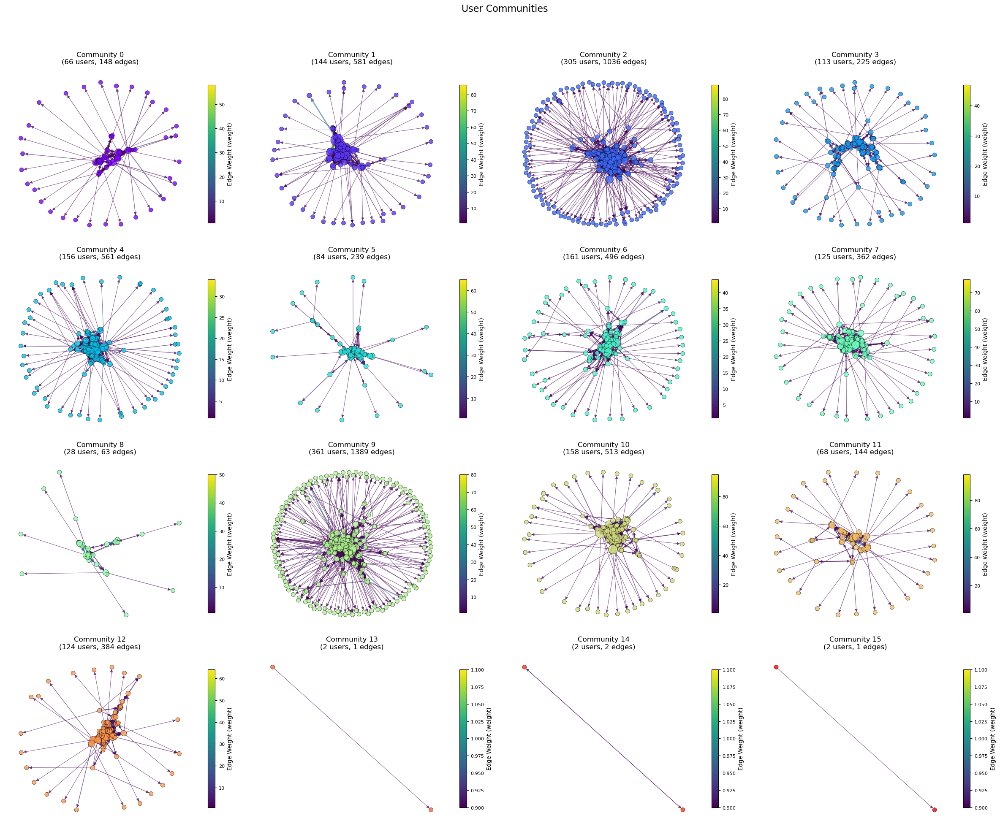

Finished generating separate community visualizations.


In [43]:
print("--- Performing community detection using Louvain algorithm ---")
node_community_mapping = {}
communities = []
modularity_score = None
num_communities = 0


if G.number_of_nodes() > 0:
    try:
        print(f"Using directed graph G with weight parameter: '{weight_param}'")
        communities_iterable = community.louvain_communities(G, weight=weight_param, seed=42)
        communities = [set(comm) for comm in communities_iterable] # Store as list of sets
        num_communities = len(communities)
        print(f"\nNumber of communities detected: {num_communities}")

        if communities:
             modularity_score = community.modularity(G, communities, weight=weight_param)
             print(f"Modularity of the partition on the original directed graph: {modularity_score:.4f}")

             # Create node-to-community mapping and add as node attribute
             for i, comm_nodes in enumerate(communities):
                 for node in comm_nodes:
                     node_community_mapping[node] = i
             nx.set_node_attributes(G, node_community_mapping, 'community')
             print("Node community mapping created and added as 'community' attribute.")

             # Print sizes of the largest communities
             community_sizes = sorted([len(c) for c in communities], reverse=True)
             print("\nSizes of the 5 largest communities:")
             print(community_sizes[:5])
        else:
             print("Louvain algorithm did not return any communities.")

    except Exception as e:
        print(f"Community detection failed: {e}")
else:
    print("Graph is empty. Skipping community detection.")


global_max_weight = 1
global_max_degree = 1
global_degrees = {}

if G.number_of_edges() > 0:
    try:
        all_weights = [d.get(weight_param, 1) for u, v, d in G.edges(data=True) if weight_param and weight_param in d]
        if all_weights:
             global_max_weight = max(all_weights) if all_weights else 1
        else:
             print(f"No edges found with weight attribute '{weight_param}'. Using default max weight 1.")
             global_max_weight = 1


        global_degrees = {node: G.degree(node, weight=weight_param) for node in G.nodes()}
        if global_degrees:
            global_max_degree = max(global_degrees.values()) if global_degrees else 1
        else:
            print("Could not calculate node degrees. Using default max degree 1.")
            global_max_degree = 1

        print(f"Global Max Weight: {global_max_weight:.2f}")
        print(f"Global Max Weighted Degree: {global_max_degree:.2f}")
    except Exception as e:
        print(f"Error calculating global metrics: {e}")

        global_max_weight = 1
        global_max_degree = 1
        global_degrees = {node: 1 for node in G.nodes()} # Assign default degree 1 to all nodes
else:
    print("Graph has no edges or nodes. Using default global metrics.")




print("\nGenerating separate community visualizations...")


if communities and num_communities > 0:

    num_communities_viz = len(communities)
    # Determine grid size for subplots
    cols = math.ceil(math.sqrt(num_communities_viz))
    rows = math.ceil(num_communities_viz / cols)

    fig_comm, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))
    if num_communities_viz == 1:
        axes = np.array([axes])
    axes = axes.flatten()


    cmap = plt.cm.rainbow


    community_colors = cmap(np.linspace(0, 1, num_communities_viz))

    last_plotted_axis_index = -1 # Keep track of the last axis used

    for i, comm_nodes in enumerate(communities):
        if i >= len(axes):
            print(f"Warning: More communities ({num_communities_viz}) than available subplots ({len(axes)}). Stopping visualization.")
            break # Avoid index error if calculation is slightly off
        ax = axes[i]
        last_plotted_axis_index = i


        subgraph = G.subgraph(comm_nodes)

        if subgraph.number_of_nodes() > 0:

            k_val = 0.7 / math.sqrt(subgraph.number_of_nodes()) if subgraph.number_of_nodes() > 1 else 0.3
            try:

                 sub_pos = nx.spring_layout(
                     subgraph,
                     seed=42,
                     k=k_val,
                     iterations=100,
                     weight=weight_param
                 )
            except nx.NetworkXError:
                 print(f"Warning: Could not compute spring layout for community {i} (possibly disconnected), using random layout.")
                 sub_pos = nx.random_layout(subgraph, seed=42)


            sub_edge_weights = { (u,v): d.get(weight_param, 1) for u, v, d in subgraph.edges(data=True) if weight_param and weight_param in d }
            if not sub_edge_weights and weight_param: # If no weights found, maybe weight_param was wrong or edges have no weight
                 sub_edge_weights = { (u,v): 1 for u, v in subgraph.edges() } # Assign default weight 1

            sub_edges = list(sub_edge_weights.keys())
            sub_weights = list(sub_edge_weights.values())


            sub_node_degrees = {n: global_degrees.get(n, 0) for n in subgraph.nodes()}
            # Scale node size: base size + scaling factor * (node_degree / max_degree)
            node_sizes = [50 + 400 * (sub_node_degrees[n] / global_max_degree) for n in subgraph.nodes()]

            # Edge widths using logarithmic scaling based on global max weight for better visual differentiation
            # Add 1 before log to handle zero weights if they exist, ensure global_max_weight is > 0
            safe_global_max_weight = max(global_max_weight, 1) # Avoid log(0) or division by zero
            sub_widths = [2 * math.log(w + 1) / math.log(safe_global_max_weight + 1) + 0.5 for w in sub_weights] if sub_weights else [0.5] * subgraph.number_of_edges()

            # Edge colors based on weight within the community
            edge_norm = Normalize(vmin=min(sub_weights, default=0), vmax=max(sub_weights, default=1))

            edge_cmap = plt.cm.viridis
            edge_colors = [edge_cmap(edge_norm(w)) for w in sub_weights]


            nx.draw_networkx_nodes(
                subgraph, sub_pos, ax=ax,
                node_size=node_sizes,
                node_color=[community_colors[i]] * subgraph.number_of_nodes(),
                alpha=0.8,
                linewidths=0.5,
                edgecolors='black'
            )


            if sub_edges:
                 nx.draw_networkx_edges(
                     subgraph, sub_pos, ax=ax,
                     edgelist=sub_edges,
                     width=sub_widths,
                     alpha=0.6,
                     edge_color=edge_colors,
                     arrows=True,
                     arrowstyle='-|>',
                     arrowsize=10,
                     node_size=node_sizes
                 )
            else:
                 print(f"Community {i} has no internal edges to draw.")



            if sub_weights:
                sm = ScalarMappable(norm=edge_norm, cmap=edge_cmap)
                sm.set_array([])
                try:
                    cbar = plt.colorbar(sm, ax=ax, label=f'Edge Weight ({weight_param})' if weight_param else 'Edge Weight', shrink=0.8)
                    cbar.ax.tick_params(labelsize=8)
                    cbar.set_label(f'Edge Weight ({weight_param})' if weight_param else 'Edge Weight', size=10)
                except Exception as e:
                    print(f"Could not add colorbar for community {i}: {e}")

            ax.set_title(f"Community {i}\n({len(comm_nodes)} users, {subgraph.number_of_edges()} edges)", fontsize=12)
        else:
            ax.set_title(f"Community {i} (Empty)", fontsize=12)

        ax.axis('off')


    for j in range(last_plotted_axis_index + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle("User Communities", fontsize=16, y=1.0)
    plt.tight_layout(rect=[0, 0.02, 1, 0.97])
    plt.show()

    print("Finished generating separate community visualizations.")
else:
    print("Skipping community visualization as no communities were detected.")



### Community Characterization

We calculate key statistics for each detected community to better understand their internal properties and compare them. Statistics include size, density, average internal degrees, and average global centrality scores of member nodes.

In [44]:
# --- Community Characterization ---
print("\nCharacterizing detected communities...")

# Prerequisites check
if 'node_community_mapping' not in locals() or not node_community_mapping:
     print("Community mapping 'node_community_mapping' not found. Skipping characterization.")
elif 'G' not in locals() or G.number_of_nodes() == 0:
     print("Graph 'G' not available or empty. Skipping characterization.")
elif 'centrality_df' not in locals():
     print("DataFrame 'centrality_df' not found. Skipping characterization.")
else:
    community_ids = sorted(list(set(node_community_mapping.values())))
    print(f"Characterizing {len(community_ids)} detected communities...")
    community_stats = []

    for comm_id in community_ids:
        comm_nodes = [node for node, c_id in node_community_mapping.items() if c_id == comm_id]
        if not comm_nodes: continue

        comm_subgraph = G.subgraph(comm_nodes)
        num_nodes = comm_subgraph.number_of_nodes()
        num_edges = comm_subgraph.number_of_edges()
        density = nx.density(comm_subgraph) if num_nodes > 1 else 0

        # Average Internal Degrees
        avg_in_degree, avg_out_degree = 0, 0
        if num_nodes > 0:
             in_degrees_internal = dict(comm_subgraph.in_degree())
             out_degrees_internal = dict(comm_subgraph.out_degree())
             if in_degrees_internal: avg_in_degree = np.mean(list(in_degrees_internal.values()))
             if out_degrees_internal: avg_out_degree = np.mean(list(out_degrees_internal.values()))

        # Average Global Centrality Scores (from centrality_df)
        avg_pagerank, avg_betweenness = 0, 0
        # Check nodes exist in centrality_df index
        valid_comm_nodes = centrality_df.index.intersection(comm_nodes)
        if not valid_comm_nodes.empty:
             comm_centralities = centrality_df.loc[valid_comm_nodes]
             # Check columns exist before calculating mean
             if 'page_rank' in comm_centralities: avg_pagerank = comm_centralities['page_rank'].mean()
             if 'betweenness' in comm_centralities: avg_betweenness = comm_centralities['betweenness'].mean()
             # Excluded eigenvector as previously decided

        stats = {
            'community_id': comm_id,
            'num_nodes': num_nodes,
            'num_edges': num_edges,
            'density': density,
            'avg_internal_in_degree': avg_in_degree,
            'avg_internal_out_degree': avg_out_degree,
            'avg_pagerank': avg_pagerank, # Using global pagerank avg
            'avg_betweenness': avg_betweenness # Using global betweenness avg
        }
        community_stats.append(stats)

    # Create DataFrame
    community_stats_df = pd.DataFrame(community_stats)
    if not community_stats_df.empty:
        community_stats_df.set_index('community_id', inplace=True)
        print("\n--- Community Statistics Summary ---")
        with pd.option_context('display.float_format', '{:,.4f}'.format):
            print(community_stats_df)
    else:
        print("No community statistics generated.")


Characterizing detected communities...
Characterizing 16 detected communities...

--- Community Statistics Summary ---
              num_nodes  num_edges  density  avg_internal_in_degree  \
community_id                                                          
0                    66        148   0.0345                  2.2424   
1                   144        581   0.0282                  4.0347   
2                   305       1036   0.0112                  3.3967   
3                   113        225   0.0178                  1.9912   
4                   156        561   0.0232                  3.5962   
5                    84        239   0.0343                  2.8452   
6                   161        496   0.0193                  3.0807   
7                   125        362   0.0234                  2.8960   
8                    28         63   0.0833                  2.2500   
9                   361       1389   0.0107                  3.8476   
10                  158     

### Interactive Network Visualizations

We create interactive visualizations of the network using Plotly. Nodes are positioned using a force-directed layout, colored by their detected community, and sized by their weighted in-degree (representing message volume received). We show both the full network and a subgraph highlighting central nodes.

In [45]:
# --- Prepare for Plotly Visualizations ---
print("Generating Plotly network visualizations...")
pos = None

if 'G' in locals() and G.number_of_nodes() > 0 and 'node_community_mapping' in locals() and node_community_mapping:
    # --- Calculate Layout ---
    if 'pos' not in locals() or pos is None:
        print("Calculating node positions using spring layout (this might take a moment)...")
        pos = nx.spring_layout(G, seed=42, k=0.1, iterations=50)
        print("Layout calculated.")
    else:
        print("Using existing node positions ('pos').")

    # --- Prepare Edge Trace (common for all plots) ---
    edge_x, edge_y = [], []
    for edge in G.edges():
        if edge[0] in pos and edge[1] in pos:
            x0, y0 = pos[edge[0]]
            x1, y1 = pos[edge[1]]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y, line=dict(width=0.3, color='#888'),
        hoverinfo='none', mode='lines')

    # --- Plot 1: Full Network (Community Color, Weighted In-Degree Size) ---
    print("\nPreparing data for Full Network plot (Community/Weighted Degree)...")
    node_x_comm, node_y_comm, node_text_comm, node_color_comm, node_size_comm = [], [], [], [], []
    colors = px.colors.qualitative.Vivid
    sizing_degree_dict = in_degrees_weighted if in_degrees_weighted else in_degrees_unweighted
    sizing_label = "Weighted" if in_degrees_weighted else "Unweighted"
    if not sizing_degree_dict:
        max_degree_val = 1
    else:
        max_degree_val = max(sizing_degree_dict.values()) if sizing_degree_dict else 1
        if sizing_label == "Unweighted": print(f"Warning: Sizing nodes by {sizing_label} in-degree.")
    min_node_size = 5
    max_node_size = 30

    for node in G.nodes():
         if node in pos:
             x, y = pos[node]
             node_x_comm.append(x); node_y_comm.append(y)
             community_id = node_community_mapping.get(node, -1)
             node_color_comm.append(colors[community_id % len(colors)])
             degree_val = sizing_degree_dict.get(node, 0)
             size = min_node_size + (max_node_size - min_node_size) * (degree_val / max(max_degree_val, 1))
             node_size_comm.append(max(size, min_node_size))
             text = f"User ID: {node}<br>Community: {community_id}<br>"
             if in_degrees_weighted: text += f"In-Degree (W): {in_degrees_weighted.get(node, 0)}<br>"
             else: text += f"In-Degree: {in_degrees_unweighted.get(node, 0)}<br>"
             if out_degrees_weighted: text += f"Out-Degree (W): {out_degrees_weighted.get(node, 0)}"
             else: text += f"Out-Degree: {out_degrees_unweighted.get(node, 0)}"
             if 'pagerank' in locals() and pagerank: text += f"<br>PageRank: {pagerank.get(node, 0):.4f}"
             node_text_comm.append(text)

    node_trace_comm = go.Scatter(
        x=node_x_comm, y=node_y_comm, text=node_text_comm, mode='markers', hoverinfo='text',
        marker=dict(showscale=False, color=node_color_comm, size=node_size_comm, line=dict(width=0.5, color='black'))
    )
    fig_full_comm = go.Figure(data=[edge_trace, node_trace_comm],
                 layout=go.Layout(
                    title=dict(text=f'Full Interactive Network (Colored by Community, Sized by {sizing_label} In-Degree)', font=dict(size=16)),
                    showlegend=False, hovermode='closest', margin=dict(b=5,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                 )
    print("Displaying full network plot (Community/Weighted Degree)...")
    fig_full_comm.show()

    # --- Plot 2: Alternative Full Network (Unweighted In-Degree Color & Size) ---
    print("\nPreparing data for Full Network plot (Unweighted Degree)...")
    if in_degrees_unweighted:
        node_x_unw, node_y_unw, node_text_unw, node_color_unw, node_size_unw = [], [], [], [], []
        max_in_degree_unw = max(in_degrees_unweighted.values()) if in_degrees_unweighted else 1
        min_node_size_alt = 4
        max_node_size_alt = 25

        for node in G.nodes():
             if node in pos:
                 x, y = pos[node]
                 node_x_unw.append(x); node_y_unw.append(y)
                 degree_unw = in_degrees_unweighted.get(node, 0)
                 size = min_node_size_alt + (max_node_size_alt - min_node_size_alt) * (degree_unw / max(max_in_degree_unw, 1))
                 node_size_unw.append(max(size, min_node_size_alt))
                 node_color_unw.append(degree_unw)
                 text = f"User ID: {node}<br>Community: {node_community_mapping.get(node, -1)}<br>"
                 text += f"In-Degree: {in_degrees_unweighted.get(node, 0)}<br>"
                 text += f"Out-Degree: {out_degrees_unweighted.get(node, 0)}"
                 node_text_unw.append(text)

        node_trace_unw = go.Scatter(
            x=node_x_unw, y=node_y_unw, text=node_text_unw, mode='markers', hoverinfo='text',
            marker=dict(
                showscale=True, colorscale='YlGnBu', color=node_color_unw, size=node_size_unw,
                colorbar=dict(
                    title=dict(text='Node In-Degree', side='right'),
                    thickness=15,
                    xanchor='left'
                ),
                line=dict(width=0.5, color='black'))
            )

        fig_full_unw = go.Figure(data=[edge_trace, node_trace_unw],
                     layout=go.Layout(
                        title=dict(text='Full Network (Colored & Sized by Unweighted In-Degree)', font=dict(size=16)),
                        showlegend=False, hovermode='closest', margin=dict(b=5,l=5,r=5,t=40),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                     )
        print("Displaying alternative full network plot (Unweighted Degree)...")
        fig_full_unw.show()
    else:
        print("Skipping alternative full network plot as unweighted degrees are unavailable.")

    # --- Plot 3: Subgraph of High-Degree Nodes ---
    if in_degrees_unweighted:
        degree_threshold_subgraph = 10
        central_nodes = {node for node, deg in in_degrees_unweighted.items() if deg >= degree_threshold_subgraph}
        subgraph_metric = "Unweighted In-Degree"
        print(f"\nCreating subgraph with nodes having {subgraph_metric} >= {degree_threshold_subgraph} ({len(central_nodes)} nodes)...")

        if central_nodes:
             sub_G = G.subgraph(central_nodes).copy()
             pos_sub = {node: pos[node] for node in central_nodes if node in pos}

             edge_x_sub, edge_y_sub = [], []
             for edge in sub_G.edges():
                 if edge[0] in pos_sub and edge[1] in pos_sub:
                     x0, y0 = pos_sub[edge[0]]; x1, y1 = pos_sub[edge[1]]
                     edge_x_sub.extend([x0, x1, None]); edge_y_sub.extend([y0, y1, None])
             edge_trace_sub = go.Scatter(x=edge_x_sub, y=edge_y_sub, line=dict(width=0.5, color='#aaa'), hoverinfo='none', mode='lines')

             node_x_sub, node_y_sub, node_text_sub, node_color_sub, node_size_sub = [], [], [], [], []
             all_nodes_list = list(G.nodes())
             for node in sub_G.nodes():
                 if node in pos_sub:
                     node_x_sub.append(pos_sub[node][0]); node_y_sub.append(pos_sub[node][1])
                     try:
                          original_index = all_nodes_list.index(node)
                          if original_index < len(node_text_comm):
                              node_text_sub.append(node_text_comm[original_index])
                              node_color_sub.append(node_color_comm[original_index])
                              node_size_sub.append(node_size_comm[original_index])
                          else: raise IndexError # Trigger fallback if index out of bounds
                     except (ValueError, IndexError): # Handle node not found or index issue
                           print(f"Warning: Could not retrieve all properties for node {node} in subgraph. Using defaults.")
                           node_text_sub.append(f"User ID: {node}")
                           node_color_sub.append(colors[node_community_mapping.get(node,-1) % len(colors)])
                           node_size_sub.append(min_node_size)

             node_trace_sub = go.Scatter(
                 x=node_x_sub, y=node_y_sub, text=node_text_sub, mode='markers', hoverinfo='text',
                 marker=dict(showscale=False, color=node_color_sub, size=node_size_sub, line=dict(width=0.5, color='black'))
             )
             fig_sub = go.Figure(data=[edge_trace_sub, node_trace_sub],
                           layout=go.Layout(
                               title=dict(text=f'Interactive Subgraph (Nodes with {subgraph_metric} >= {degree_threshold_subgraph})', font=dict(size=16)),
                               showlegend=False, hovermode='closest', margin=dict(b=5,l=5,r=5,t=40),
                               xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                               yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                           )
             print("Displaying subgraph plot...")
             fig_sub.show()
        else:
             print("No nodes met the threshold for subgraph visualization.")
    else:
         print("Skipping subgraph plot as unweighted degrees are unavailable.")
else:
    print("Skipping Plotly visualizations as graph is empty or community mapping failed.")

Generating Plotly network visualizations...
Calculating node positions using spring layout (this might take a moment)...
Layout calculated.

Preparing data for Full Network plot (Community/Weighted Degree)...
Displaying full network plot (Community/Weighted Degree)...



Preparing data for Full Network plot (Unweighted Degree)...
Displaying alternative full network plot (Unweighted Degree)...



Creating subgraph with nodes having Unweighted In-Degree >= 10 (627 nodes)...
Displaying subgraph plot...
